In [ ]:
!pip install tqdm
!mkdir animation
!pip install imageio-ffmpeg

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from sklearn.datasets import make_moons, make_circles

def make_dataloader(generator,n,
                 noise=0.05,seed=0,
                 batch_size=128):

    X,y = generator(n_samples=n,
                        shuffle=False,
                        noise=noise,
                        random_state=seed)

    inputs = torch.hstack([
        torch.Tensor(X),torch.Tensor(y[...,None])
    ])

    dataloader = torch.utils.data.DataLoader(inputs,
                                             batch_size=batch_size,
                                             pin_memory=True,
                                             shuffle=True)
    return dataloader


def make_spiral(n_samples,
                shuffle=False,
                noise=1,
                random_state=0,
                rotations=1.5,
                ):
  '''
  Make spiral dataset
  '''

  N = n_samples
  pi = rotations*np.pi
  theta = np.sqrt(np.random.rand(N))*2*pi # np.linspace(0,2*pi,100)

  r_a = 2*theta + pi
  data_a = np.array([np.cos(theta)*r_a, np.sin(theta)*r_a]).T
  x_a = data_a + np.random.randn(N,2)*1

  r_b = -2*theta - pi
  data_b = np.array([np.cos(theta)*r_b, np.sin(theta)*r_b]).T
  x_b = data_b + np.random.randn(N,2)*1

  res_a = np.append(x_a, np.zeros((N,1)), axis=1)
  res_b = np.append(x_b, np.ones((N,1)), axis=1)

  res = np.append(res_a, res_b, axis=0)
  np.random.shuffle(res)

  return res[:,:2],res[:,-1]

(-24.78274917602539, 24.71941375732422)

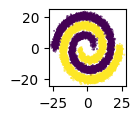

In [ ]:
#@title Prepare Data and Specify Input Domain

# prepare data
# dataloader = make_dataloader(make_moons,10000)
# dataloader = make_dataloader(make_circles,10000)
dataloader = make_dataloader(make_spiral,10000)

# get upper and lower bounds
xlow,ylow = dataloader.__dict__['dataset'][:,:-1].min(0)[0].numpy()
xhigh,yhigh = dataloader.__dict__['dataset'][:,:-1].max(0)[0].numpy()

# ROI square domain at the input space
pad = 1.5
domain = torch.tensor([
    [xlow,ylow],
    [xlow,yhigh],
    [xhigh,yhigh],
    [xhigh,ylow],
    [xlow,ylow]
])

domain += np.sign(domain)*1.5

# Get projection matrix for 2D<->input
T = torch.eye(3)[:-1]

## plot data and set domain boundaries
plt.figure(figsize=(1,1))
plt.scatter(dataloader.__dict__['dataset'][:,:-1].numpy()[:,0],
            dataloader.__dict__['dataset'][:,:-1].numpy()[:,1],
            c = dataloader.__dict__['dataset'][:,-1].numpy(), s = .1,
           )
plt.xlim([domain[0][0],domain[2][0]])
plt.ylim([domain[0][1],domain[2][1]])

In [ ]:
##model def

width = 10
depth = 5
activation_fn = torch.nn.Sigmoid  ## torch.nn.LeakyReLU
device='cpu'
train = True
bias = True

# create model
layers = [torch.nn.Flatten()]
for i in range(depth):
    if i == 0:
        layers.append(torch.nn.Linear(np.prod(2), width))
        layers.append(activation_fn())
    elif i == depth - 1:
        layers.append(nn.Linear(width, 1))
    else:
        layers.append(nn.Linear(width, width))
        layers.append(activation_fn())
model = nn.Sequential(*layers).to(device)

## bias cant be none for splinecam library, hence we separately set it to zero
if not bias:
  for layer in model:
    if hasattr(layer,'bias'):
      layer.bias = torch.nn.Parameter(torch.zeros_like(layer.bias)+1e-6)

In [ ]:
def sigmoid(x):
    return 1/(1+np.exp(-x))

def fn(out_pre,model_dict_ls,li):
    if li == len(model_dict_ls)/2:
        return out_pre
    out_cur = []
    for i in range(len(model_dict_ls[2*li])):
        x = 0
        for j in range(len(out_pre)):
            x = x + out_pre[j]*model_dict_ls[2*li][i][j]
        if li == (len(model_dict_ls)/2)-1:
            out_cur.append(x+model_dict_ls[2*li+1][i])
        else:
            out_cur.append(sigmoid(x+model_dict_ls[2*li+1][i]))
    li+=1
    return fn(np.array(out_cur),model_dict_ls,li)

In [ ]:
#@title Train and visualize per iteration
import time

start_time = time.time()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss()

epochs = 200
device = 'cpu'
model = model.to(device)
loss_data = []

for epoch in range(1, epochs + 1):

    ## train step

    model.train()
    total_loss = 0
    for batch_idx, data in enumerate(dataloader, 1):

        # prep data
        data,target = data[:,:-1],data[:,-1:]
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad() # zero accumulated gradients
        output = model(data)

        # calculate loss and perform backprop
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    ## visualize partition
    model.eval()

    #print('Wrapping model with sigmaCam...')


    plt.rcParams['figure.dpi'] = 300
    fig,ax = plt.subplots()
    X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
    c = dataloader.__dict__['dataset'][:,-1].numpy()
    y3 = dataloader.__dict__['dataset'][:,-1].numpy()
    # Plot the second graph (Scatter Plot with predicted class)
    ax.scatter(X3[:, 0], X3[:, 1], c=y3,s=.5, cmap='viridis')
    x2 = np.linspace(domain[0][0],domain[2][0], 100)
    y2 = np.linspace(domain[0][1],domain[2][1], 100)
    X2, Y2 = np.meshgrid(x2, y2)
    model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
    Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
    # Plot the equation as a contour line
    plt.contour(X2, Y2, Z, levels=[0], colors='red')
    plt.savefig(f'./animation/{epoch}.png',bbox_inches='tight',pad_inches=0)
    plt.close()


    if (epoch + 1) % 50 == 0:
        X3_tensor = torch.from_numpy(X3)

        # Make predictions
        with torch.no_grad():
            predicted = model(X3_tensor).numpy()
            predictions = (predicted > 0.5).astype(int)
            predictions = predictions.flatten()

        # Calculate the accuracy
        accuracy = np.mean(predictions == y3)
        print("Accuracy:", accuracy)
        elapsed_time = time.time() - start_time
        print(f"Epoch {epoch + 1}, Time elapsed: {elapsed_time:.2f} seconds")
        start_time = time.time()

    model.train()

    loss_data.append(total_loss / len(dataloader))


Accuracy: 0.73625
Epoch 50, Time elapsed: 80.47 seconds
Accuracy: 0.79905
Epoch 100, Time elapsed: 80.59 seconds
Accuracy: 0.92275
Epoch 150, Time elapsed: 81.39 seconds
Accuracy: 0.97985
Epoch 200, Time elapsed: 82.14 seconds


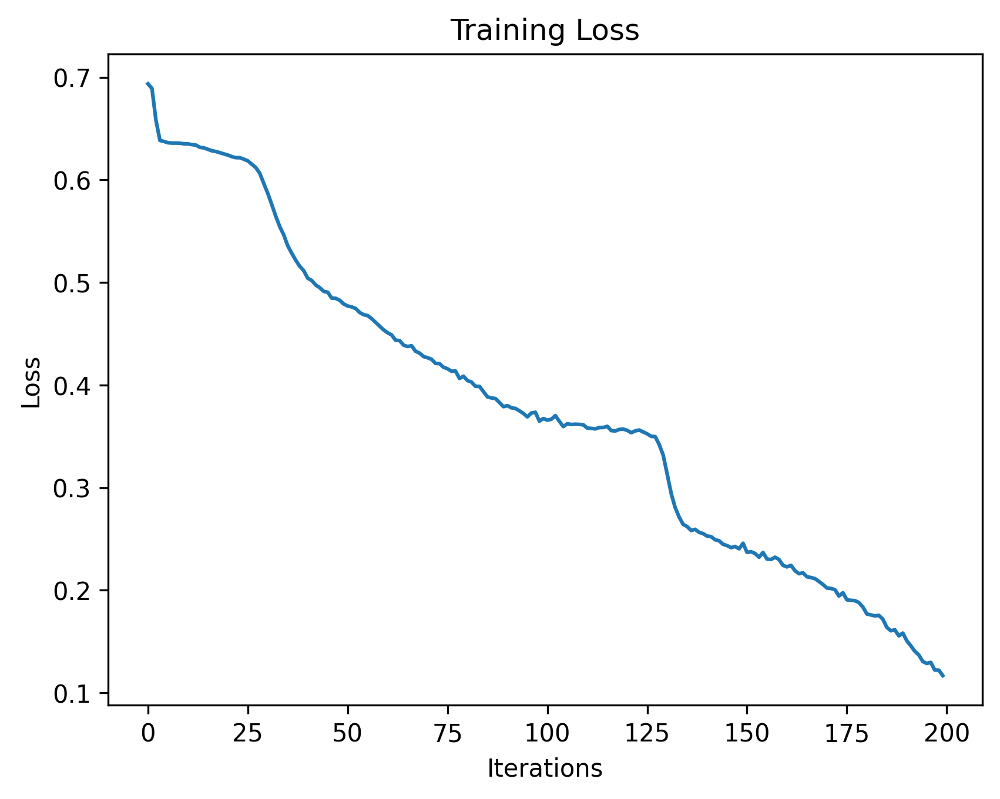

In [ ]:
# Plot the loss data
plt.figure()
plt.plot(loss_data)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [ ]:
#@title Create Animation

import glob
import imageio
import numpy as np
import tqdm
from cv2 import imread

## list files
files = np.asarray(glob.glob('./animation/*.png'))
idx = np.asarray([int(each.split('/')[-1].split('.')[0]) for each in files])
files = files[idx.argsort()]

## export mp4
fps = 30
with imageio.get_writer('test.mp4', mode='I', fps=fps) as writer:
    for each in tqdm.tqdm(files):
        img = imread(each)[...,::-1] # BRG to RGB
        writer.append_data(img)

100%|██████████| 200/200 [00:25<00:00,  7.90it/s]


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('test.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Accuracy: 0.97995


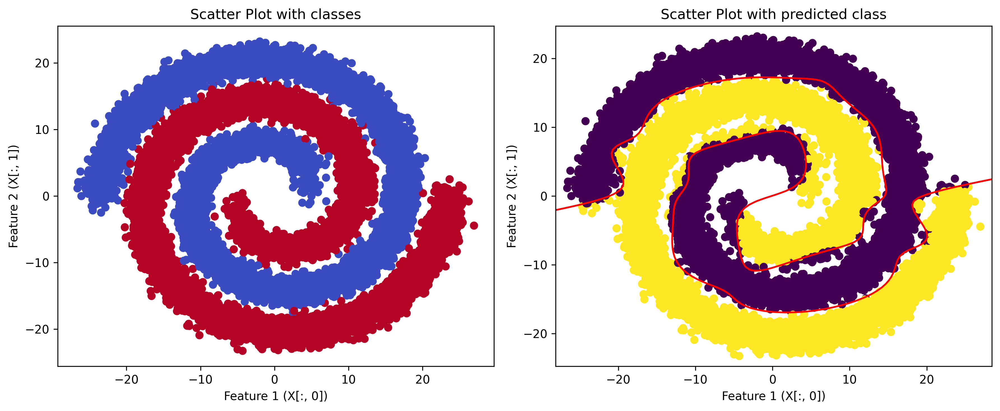

In [ ]:
X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
c = dataloader.__dict__['dataset'][:,-1].numpy()
y3 = dataloader.__dict__['dataset'][:,-1].numpy()

X3_tensor = torch.from_numpy(X3).float()

# Make predictions
with torch.no_grad():
    predicted = model(X3_tensor).numpy()
    predictions = (predicted > 0.5).astype(int)
    predictions = predictions.flatten()

# Calculate the accuracy
accuracy = np.mean(predictions == y3)
print("Accuracy:", accuracy)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))



#plt.xlim([domain[0][0],domain[2][0]])
#plt.ylim([domain[0][1],domain[2][1]])

# Plot the color-coded classification
ax1.scatter(X3[:, 0], X3[:, 1], c=y3, cmap='coolwarm')
ax1.set_xlabel('Feature 1 (X[:, 0])')
ax1.set_ylabel('Feature 2 (X[:, 1])')
ax1.set_title('Scatter Plot with classes')

# Plot the second graph (Scatter Plot with predicted class)
ax2.scatter(X3[:, 0], X3[:, 1], c=predictions, cmap='viridis')
x2 = np.linspace(domain[0][0],domain[2][0], 100)
y2 = np.linspace(domain[0][1],domain[2][1], 100)
X2, Y2 = np.meshgrid(x2, y2)
#Z2 = (model2.fc2.weight.data[0][0]*(1/(1+np.exp((-model2.fc1.weight.data[0][0])* X2 - model2.fc1.weight.data[0][1]* Y2 - model2.fc1.bias.data[0])))) +(model2.fc2.weight.data[0][1]*(1/(1+ np.exp(-model2.fc1.weight.data[1][0] * X2 - model2.fc1.weight.data[1][1]*Y2 - model2.fc1.bias.data[1])))) +model2.fc2.bias.data[0]
model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
# Plot the equation as a contour line
plt.contour(X2, Y2, Z, levels=[0], colors='red')
ax2.set_xlabel('Feature 1 (X[:, 0])')
ax2.set_ylabel('Feature 2 (X[:, 1])')
ax2.set_title('Scatter Plot with predicted class')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [ ]:
#@title Train and visualize per iteration
import time

start_time = time.time()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss()

epochs = 400

for epoch in range(201, epochs + 1):

    ## train step

    model.train()
    total_loss = 0
    for batch_idx, data in enumerate(dataloader, 1):

        # prep data
        data,target = data[:,:-1],data[:,-1:]
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad() # zero accumulated gradients
        output = model(data)

        # calculate loss and perform backprop
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    ## visualize partition
    model.eval()

    #print('Wrapping model with sigmaCam...')


    plt.rcParams['figure.dpi'] = 300
    fig,ax = plt.subplots()
    X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
    c = dataloader.__dict__['dataset'][:,-1].numpy()
    y3 = dataloader.__dict__['dataset'][:,-1].numpy()
    # Plot the second graph (Scatter Plot with predicted class)
    ax.scatter(X3[:, 0], X3[:, 1], c=y3,s=.5, cmap='viridis')
    x2 = np.linspace(domain[0][0],domain[2][0], 100)
    y2 = np.linspace(domain[0][1],domain[2][1], 100)
    X2, Y2 = np.meshgrid(x2, y2)
    model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
    Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
    # Plot the equation as a contour line
    plt.contour(X2, Y2, Z, levels=[0], colors='red')
    plt.savefig(f'./animation/{epoch}.png',bbox_inches='tight',pad_inches=0)
    plt.close()


    if (epoch + 1) % 50 == 0:
        X3_tensor = torch.from_numpy(X3)

        # Make predictions
        with torch.no_grad():
            predicted = model(X3_tensor).numpy()
            predictions = (predicted > 0.5).astype(int)
            predictions = predictions.flatten()

        # Calculate the accuracy
        accuracy = np.mean(predictions == y3)
        print("Accuracy:", accuracy)
        elapsed_time = time.time() - start_time
        print(f"Epoch {epoch + 1}, Time elapsed: {elapsed_time:.2f} seconds")
        start_time = time.time()

    model.train()

    loss_data.append(total_loss / len(dataloader))


Accuracy: 0.98645
Epoch 250, Time elapsed: 89.64 seconds
Accuracy: 0.97995
Epoch 300, Time elapsed: 86.80 seconds
Accuracy: 0.9671
Epoch 350, Time elapsed: 81.75 seconds
Accuracy: 0.9851
Epoch 400, Time elapsed: 82.51 seconds


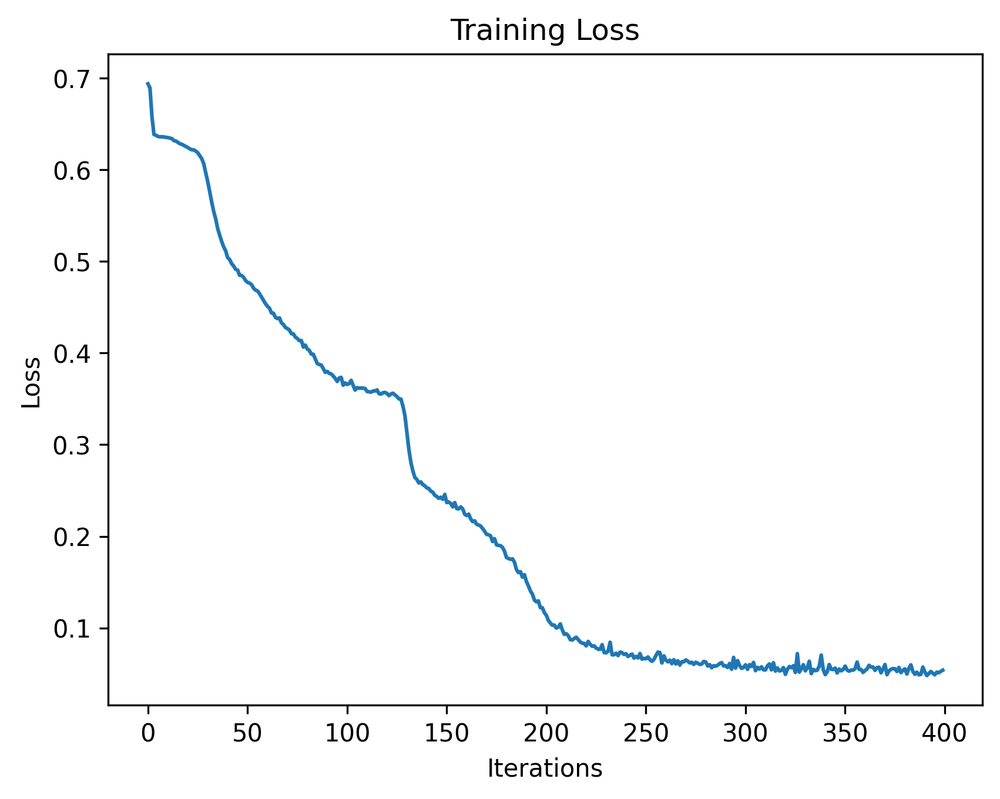

In [ ]:
# Plot the loss data
plt.figure()
plt.plot(loss_data)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [ ]:
#@title Create Animation

import glob
import imageio
import numpy as np
import tqdm
from cv2 import imread

## list files
files = np.asarray(glob.glob('./animation/*.png'))
idx = np.asarray([int(each.split('/')[-1].split('.')[0]) for each in files])
files = files[idx.argsort()]

## export mp4
fps = 30
with imageio.get_writer('test2+.mp4', mode='I', fps=fps) as writer:
    for each in tqdm.tqdm(files):
        img = imread(each)[...,::-1] # BRG to RGB
        writer.append_data(img)

100%|██████████| 400/400 [00:50<00:00,  7.86it/s]


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('test2+.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Accuracy: 0.9722


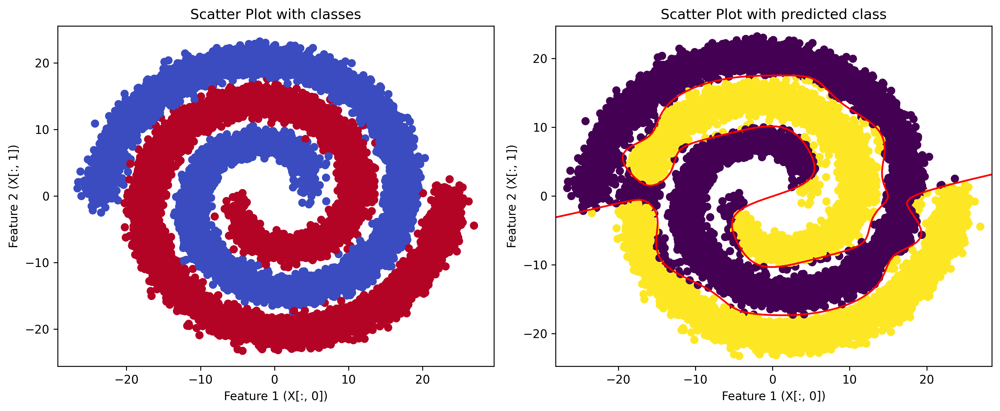

In [ ]:
X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
c = dataloader.__dict__['dataset'][:,-1].numpy()
y3 = dataloader.__dict__['dataset'][:,-1].numpy()

X3_tensor = torch.from_numpy(X3).float()

# Make predictions
with torch.no_grad():
    predicted = model(X3_tensor).numpy()
    predictions = (predicted > 0.5).astype(int)
    predictions = predictions.flatten()

# Calculate the accuracy
accuracy = np.mean(predictions == y3)
print("Accuracy:", accuracy)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))



#plt.xlim([domain[0][0],domain[2][0]])
#plt.ylim([domain[0][1],domain[2][1]])

# Plot the color-coded classification
ax1.scatter(X3[:, 0], X3[:, 1], c=y3, cmap='coolwarm')
ax1.set_xlabel('Feature 1 (X[:, 0])')
ax1.set_ylabel('Feature 2 (X[:, 1])')
ax1.set_title('Scatter Plot with classes')

# Plot the second graph (Scatter Plot with predicted class)
ax2.scatter(X3[:, 0], X3[:, 1], c=predictions, cmap='viridis')
x2 = np.linspace(domain[0][0],domain[2][0], 100)
y2 = np.linspace(domain[0][1],domain[2][1], 100)
X2, Y2 = np.meshgrid(x2, y2)
#Z2 = (model2.fc2.weight.data[0][0]*(1/(1+np.exp((-model2.fc1.weight.data[0][0])* X2 - model2.fc1.weight.data[0][1]* Y2 - model2.fc1.bias.data[0])))) +(model2.fc2.weight.data[0][1]*(1/(1+ np.exp(-model2.fc1.weight.data[1][0] * X2 - model2.fc1.weight.data[1][1]*Y2 - model2.fc1.bias.data[1])))) +model2.fc2.bias.data[0]
model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
# Plot the equation as a contour line
plt.contour(X2, Y2, Z, levels=[0], colors='red')
ax2.set_xlabel('Feature 1 (X[:, 0])')
ax2.set_ylabel('Feature 2 (X[:, 1])')
ax2.set_title('Scatter Plot with predicted class')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [ ]:

torch.save(model.state_dict(), 'spiral_model.pth')

In [ ]:
#@title Train and visualize per iteration
import time

start_time = time.time()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
criterion = nn.BCEWithLogitsLoss()

epochs = 500

for epoch in range(401, epochs + 1):

    ## train step

    model.train()
    total_loss = 0
    for batch_idx, data in enumerate(dataloader, 1):

        # prep data
        data,target = data[:,:-1],data[:,-1:]
        data, target = data.to(device), target.to(device)

        optimizer.zero_grad() # zero accumulated gradients
        output = model(data)

        # calculate loss and perform backprop
        loss = criterion(output, target)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    ## visualize partition
    model.eval()

    #print('Wrapping model with sigmaCam...')


    plt.rcParams['figure.dpi'] = 300
    fig,ax = plt.subplots()
    X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
    c = dataloader.__dict__['dataset'][:,-1].numpy()
    y3 = dataloader.__dict__['dataset'][:,-1].numpy()
    # Plot the second graph (Scatter Plot with predicted class)
    ax.scatter(X3[:, 0], X3[:, 1], c=y3,s=.5, cmap='viridis')
    x2 = np.linspace(domain[0][0],domain[2][0], 100)
    y2 = np.linspace(domain[0][1],domain[2][1], 100)
    X2, Y2 = np.meshgrid(x2, y2)
    model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
    Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
    # Plot the equation as a contour line
    plt.contour(X2, Y2, Z, levels=[0], colors='red')
    plt.savefig(f'./animation/{epoch}.png',bbox_inches='tight',pad_inches=0)
    plt.close()


    if (epoch + 1) % 50 == 0:
        X3_tensor = torch.from_numpy(X3)

        # Make predictions
        with torch.no_grad():
            predicted = model(X3_tensor).numpy()
            predictions = (predicted > 0.5).astype(int)
            predictions = predictions.flatten()

        # Calculate the accuracy
        accuracy = np.mean(predictions == y3)
        print("Accuracy:", accuracy)
        elapsed_time = time.time() - start_time
        print(f"Epoch {epoch + 1}, Time elapsed: {elapsed_time:.2f} seconds")
        start_time = time.time()

    model.train()

    loss_data.append(total_loss / len(dataloader))


Accuracy: 0.9826
Epoch 450, Time elapsed: 79.68 seconds
Accuracy: 0.9816
Epoch 500, Time elapsed: 84.34 seconds


In [ ]:
# Plot the loss data
plt.figure()
plt.plot(loss_data)
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()

In [ ]:
#@title Create Animation

import glob
import imageio
import numpy as np
import tqdm
from cv2 import imread

## list files
files = np.asarray(glob.glob('./animation/*.png'))
idx = np.asarray([int(each.split('/')[-1].split('.')[0]) for each in files])
files = files[idx.argsort()]

## export mp4
fps = 30
with imageio.get_writer('test3.mp4', mode='I', fps=fps) as writer:
    for each in tqdm.tqdm(files):
        img = imread(each)[...,::-1] # BRG to RGB
        writer.append_data(img)

100%|██████████| 500/500 [01:09<00:00,  7.17it/s]


In [ ]:
from IPython.display import HTML
from base64 import b64encode
mp4 = open('test3.mp4','rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()

HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

Accuracy: 0.98375


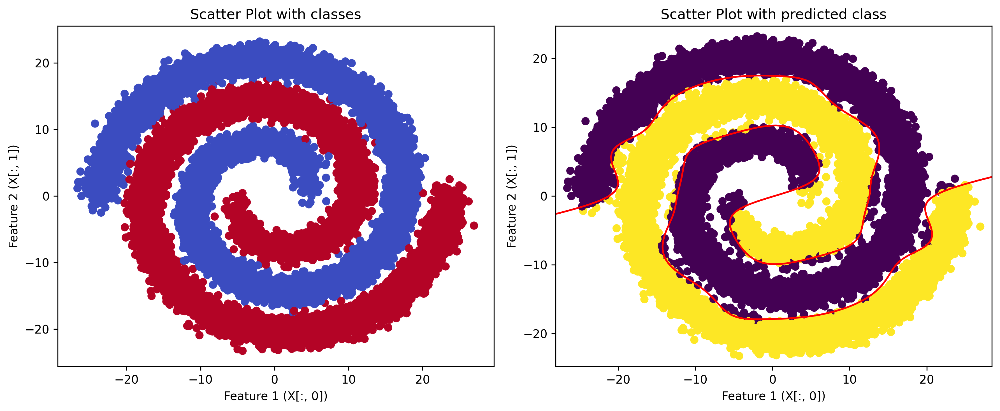

In [ ]:
X3 = dataloader.__dict__['dataset'][:,:-1].numpy()
c = dataloader.__dict__['dataset'][:,-1].numpy()
y3 = dataloader.__dict__['dataset'][:,-1].numpy()

X3_tensor = torch.from_numpy(X3).float()

# Make predictions
with torch.no_grad():
    predicted = model(X3_tensor).numpy()
    predictions = (predicted > 0.5).astype(int)
    predictions = predictions.flatten()

# Calculate the accuracy
accuracy = np.mean(predictions == y3)
print("Accuracy:", accuracy)

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))



#plt.xlim([domain[0][0],domain[2][0]])
#plt.ylim([domain[0][1],domain[2][1]])

# Plot the color-coded classification
ax1.scatter(X3[:, 0], X3[:, 1], c=y3, cmap='coolwarm')
ax1.set_xlabel('Feature 1 (X[:, 0])')
ax1.set_ylabel('Feature 2 (X[:, 1])')
ax1.set_title('Scatter Plot with classes')

# Plot the second graph (Scatter Plot with predicted class)
ax2.scatter(X3[:, 0], X3[:, 1], c=predictions, cmap='viridis')
x2 = np.linspace(domain[0][0],domain[2][0], 100)
y2 = np.linspace(domain[0][1],domain[2][1], 100)
X2, Y2 = np.meshgrid(x2, y2)
#Z2 = (model2.fc2.weight.data[0][0]*(1/(1+np.exp((-model2.fc1.weight.data[0][0])* X2 - model2.fc1.weight.data[0][1]* Y2 - model2.fc1.bias.data[0])))) +(model2.fc2.weight.data[0][1]*(1/(1+ np.exp(-model2.fc1.weight.data[1][0] * X2 - model2.fc1.weight.data[1][1]*Y2 - model2.fc1.bias.data[1])))) +model2.fc2.bias.data[0]
model_dict_ls = [np.array(ls) for ls in list(model.state_dict().values())]
Z = fn(np.array([X2,Y2]),model_dict_ls,0)[0]
# Plot the equation as a contour line
plt.contour(X2, Y2, Z, levels=[0], colors='red')
ax2.set_xlabel('Feature 1 (X[:, 0])')
ax2.set_ylabel('Feature 2 (X[:, 1])')
ax2.set_title('Scatter Plot with predicted class')

# Adjust layout and display the plots
plt.tight_layout()
plt.show()

In [ ]:


torch.save(model.state_dict(), 'Spiral_model500s.pth')